In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_absolute_error, mean_squared_error, root_mean_squared_error

# Configuración general
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams.update({
    "text.usetex": False,              # Usa True si tienes LaTeX instalado
    "font.family": "serif",            # Usa tipografía tipo LaTeX
    "font.serif": ["Times New Roman"], # O usa "Computer Modern Roman", "Palatino", etc.
    "text.latex.preamble": r"\usepackage{amsmath,amssymb}",  # Carga paquetes comunes
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "figure.dpi": 150,
    "figure.figsize": (6, 2.5),        # En la misma línea
    "savefig.bbox": "tight"
})

# --- 1. Tamaño y resolución de figuras ---
plt.rcParams['figure.figsize'] = (6, 4)  # Tamaño base de figuras
plt.rcParams['figure.dpi'] = 300         # Alta resolución para publicaciones

# --- 2. Fuente tipo LaTeX ---
mpl.rcParams['text.usetex'] = False
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

# --- 3. Estilo elegante y minimalista ---
sns.set_theme(style="white", palette="viridis", font_scale=1.0)


# Elegante y visible
sns.set_palette("cubehelix")


# Dark green to black:
DG_to_Bl = sns.color_palette("dark:#5A9_r") #, as_cmap=True)
# Grey blue to bone:
GB_to_Bo = sns.color_palette("blend:#7AB,#EDA") #, as_cmap=True)


# Elegante y visible
sns.set_palette(DG_to_Bl)



# Alternativas:
# sns.set_palette("Set2")
# sns.set_palette("coolwarm")
# sns.set_palette("crest")  # para categorías suaves

In [2]:
def plot_graphs(n=1, plot_type='curve'):
    """
    Dibuja n gráficas en fila horizontal, con aspect ratio cuadrado y fuentes estilo LaTeX.
    
    Parámetros:
    - n: int, número de gráficas
    - plot_type: 'curve' o 'image'
    """
    # Estilo LaTeX y fuente legible
    plt.rcParams.update({
        "text.usetex": False,
        "font.size": 14,
        "font.family": "serif",
        "axes.titlesize": 16,
        "axes.labelsize": 14
    })

    fig, axs = plt.subplots(1, n, figsize=(5 * n, 5), constrained_layout=True)

    if n == 1:
        axs = [axs]  # convierte en lista para tratamiento uniforme

    for i, ax in enumerate(axs):
        if plot_type == 'curve':
            x = np.linspace(0, 2 * np.pi, 100)
            y = np.sin(x + i)
            ax.plot(x, y, label=fr"$\sin(x + {i})$")
            ax.set_title(fr"Curva {i+1}")
            ax.set_xlabel(r"$x$")
            ax.set_ylabel(r"$y$")
            ax.legend()
        elif plot_type == 'image':
            data = np.random.rand(10, 10)
            im = ax.imshow(data, cmap='viridis', origin='lower')
            ax.set_title(fr"Imagen {i+1}")
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        
        ax.set_aspect('equal')  # aspect ratio cuadrado

    plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   M_s                1000 non-null   float64
 1   A_ex               1000 non-null   float64
 2   K_u                1000 non-null   int64  
 3   alpha              1000 non-null   float64
 4   angle_theta        1000 non-null   float64
 5   angle_phi          1000 non-null   float64
 6   Transmission       1000 non-null   float64
 7   Phase Shift (deg)  1000 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 62.6 KB
None
                 M_s          A_ex     K_u        alpha  angle_theta  \
count    1000.000000  1.000000e+03  1000.0  1000.000000  1000.000000   
mean    72646.444567  4.000000e-12     0.0     0.015490    45.009230   
std     28001.224414  8.081978e-28     0.0     0.003178    26.008575   
min     24250.156001  4.000000e-12     0.0     0.010000     0.010314   

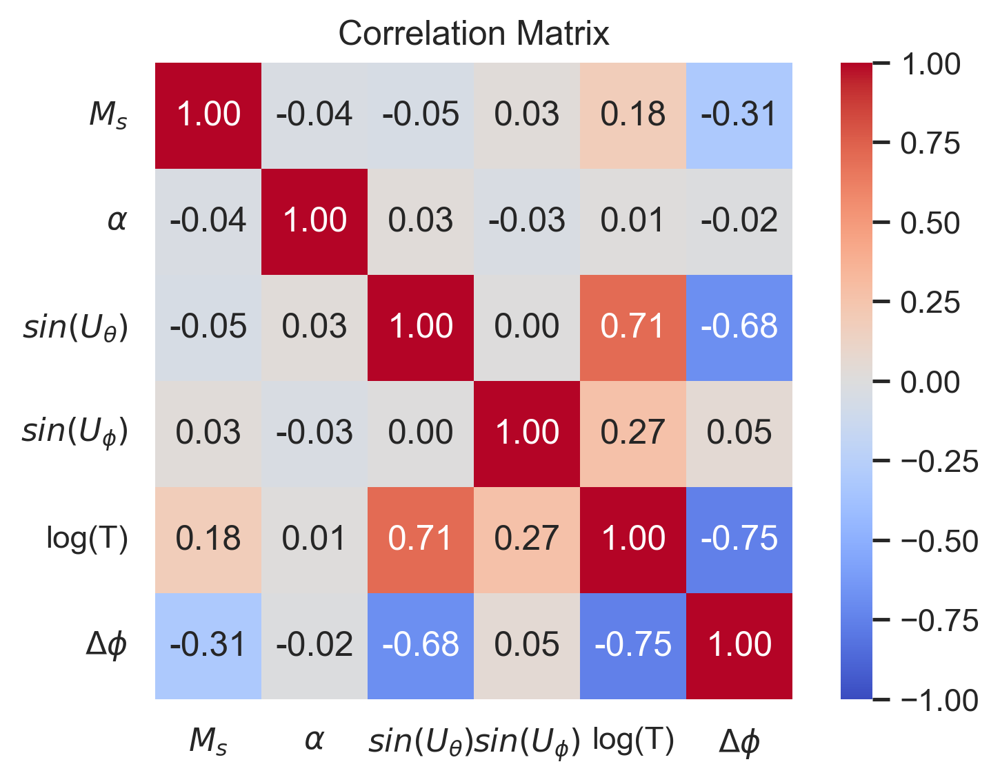

In [3]:

# Load dataset

#df = pd.read_csv("D:\\UBERMAG_RESULTS\\spin_wave_results-two-bounds-lhs-1000.csv")  # Update with the actual filename
df = pd.read_csv("D:\\UBERMAG_RESULTS\\spin_wave_results_LHS_1000_LG2um.csv")  # Update with the actual filename 

# Check basic stats
print(df.info())
print(df.describe())


df = df[df["Transmission"] <= 0.99]
print(np.max(df["Transmission"]))
#df["Transmission"] = df["Transmission"] / np.max(df["Transmission"])


# Transform Phase Shift.


phases_rad = np.deg2rad(df["Phase Shift (deg)"])
mean_phase = np.angle(np.mean(np.exp(1j * phases_rad)))
centered_phases_rad = np.angle(np.exp(1j * (phases_rad - mean_phase)))
df["Phase Shift (deg)"] = np.rad2deg(centered_phases_rad) + 180


# TRANSFORM angle_u to sin(angle_u)


df["angle_theta"] = np.sin(df["angle_theta"] * np.pi / 180)
df.rename(columns={"angle_theta": r"$sin(U_\theta)$"}, inplace=True)

df["angle_phi"] = np.sin(df["angle_phi"] * np.pi / 180)
df.rename(columns={"angle_phi": r"$sin(U_\phi)$"}, inplace=True)

df["Transmission"] = np.log(df["Transmission"])
df.rename(columns={"Transmission": "log(T)"}, inplace=True)

df.rename(columns={"Phase Shift (deg)": r"$\Delta \phi$"}, inplace=True)
df.rename(columns={"M_s": r"$M_s$"}, inplace=True)
df.rename(columns={"alpha": r"$\alpha$"}, inplace=True)

df = df.drop(columns=['A_ex', 'K_u'])
df = df.drop_duplicates()

# Check basic stats
print(df.info())
print(df.describe())


# Check correlation matrix

fig, ax = plt.subplots(ncols=1, sharey=True)

# plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", vmin=-1.00, vmax=1.00, fmt=".2f", )
plt.savefig("Correlation_Matrix.pdf", format='pdf')
ax.set_box_aspect(1)  # Makes the plot square
plt.title("Correlation Matrix")
plt.show()


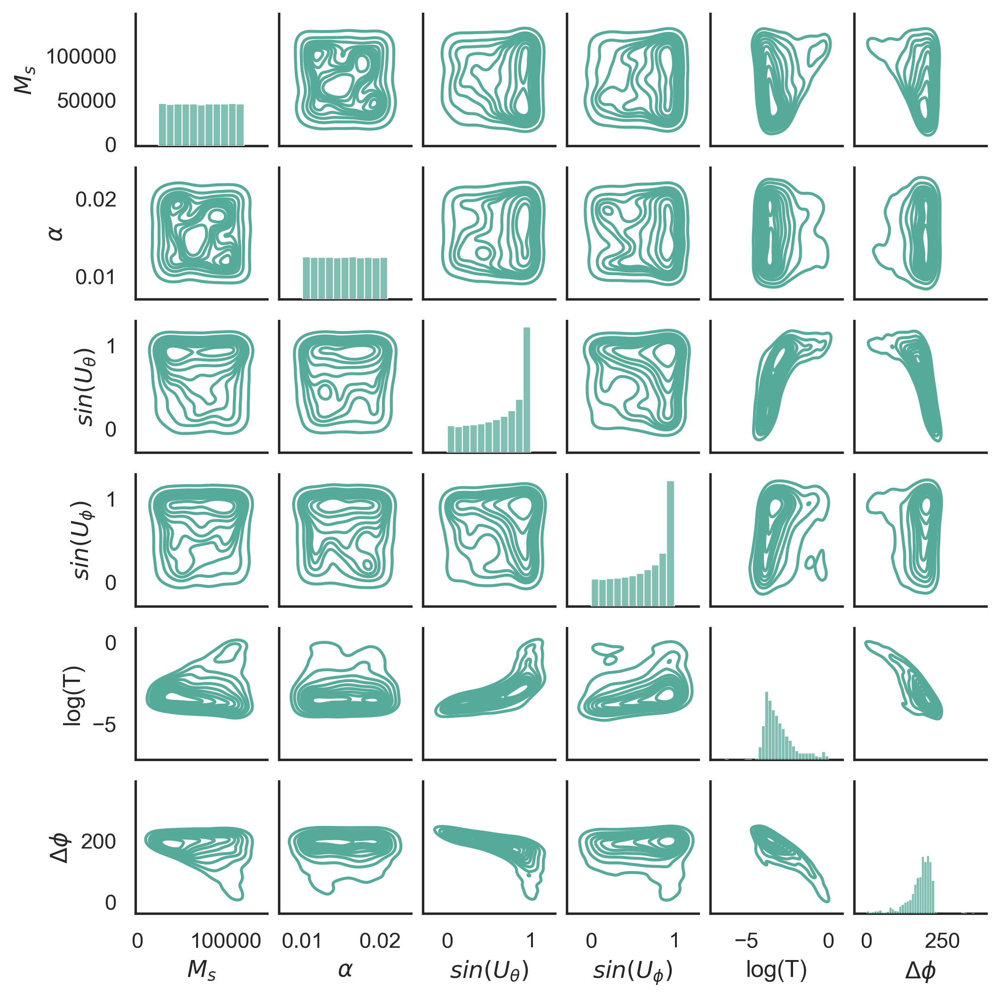

In [4]:
# Visualize clusters
sns.pairplot(df, diag_kind="hist", kind='kde', height=1.2)  # 
plt.savefig("Pairplots_kde.pdf", format='pdf')
plt.show()


Calculate the Variance Inflation Factor (VIF) to identify multicollinearity. If some features have VIF > 10, we should consider removing or combining them.

In [5]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df.drop(columns=["log(T)", r"$\Delta \phi$"])  # Exclude target variables
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)  # High VIF (>10) means high multicollinearity

# ONCE THE HIGH-VIF PARAMETERS ARE IDENTIFIED:

X = X.drop(columns=[r"$\alpha$"])  # Update this with your chosen variables



           Feature       VIF
0            $M_s$  6.285173
1         $\alpha$  9.927785
2  $sin(U_\theta)$  4.748980
3    $sin(U_\phi)$  4.680089


If we detect strong correlations, we apply PCA.

Explained Variance Ratio: [0.35212768 0.33433262]


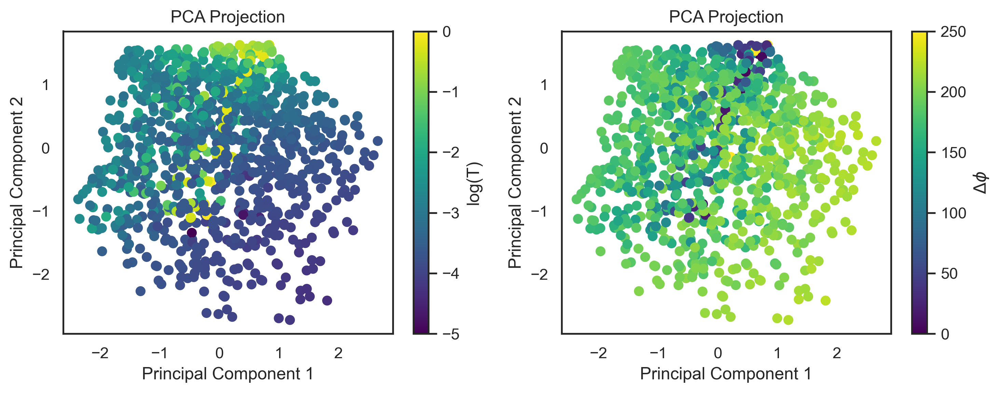

In [6]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=2)  # Try reducing to 2 components
X_pca = pca.fit_transform(X_scaled)

# Explained variance
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

# Create a 1x2 subplot
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300)

# --- First PCA plot: colored by log(T)
sc0 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=df["log(T)"], cmap="viridis", vmin=-5, vmax=0)
axes[0].set_xlabel("Principal Component 1")
axes[0].set_ylabel("Principal Component 2")
axes[0].set_title("PCA Projection")
cbar0 = fig.colorbar(sc0, ax=axes[0])
cbar0.set_label("log(T)")

# --- Second PCA plot: colored by Δϕ
sc1 = axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=df[r"$\Delta \phi$"], cmap="viridis", vmin=0, vmax=250)
axes[1].set_xlabel("Principal Component 1")
axes[1].set_ylabel("Principal Component 2")
axes[1].set_title("PCA Projection")
cbar1 = fig.colorbar(sc1, ax=axes[1])
cbar1.set_label(r"$\Delta \phi$")

# Adjust layout
plt.tight_layout()
plt.show()

fig.savefig("PCA_plot.pdf", format='pdf')



        $M_s$  $sin(U_\theta)$  $sin(U_\phi)$
PC1  0.715764        -0.626272       0.308974
PC2  0.034201         0.473345       0.880213


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (3,) and arg 1 with shape (2,).

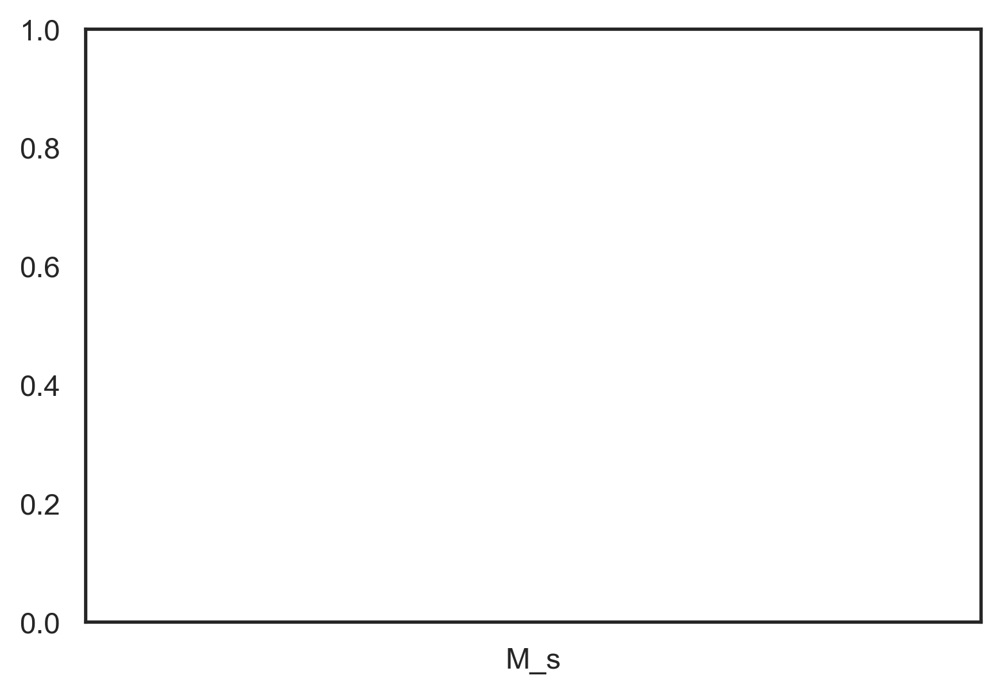

In [7]:
print(pd.DataFrame(pca.components_, columns=X.columns, index=['PC1', 'PC2']))


Check if there are natural clusters in the data.

C:\Users\david.osuna\AppData\Local\anaconda3\envs\ubermag\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


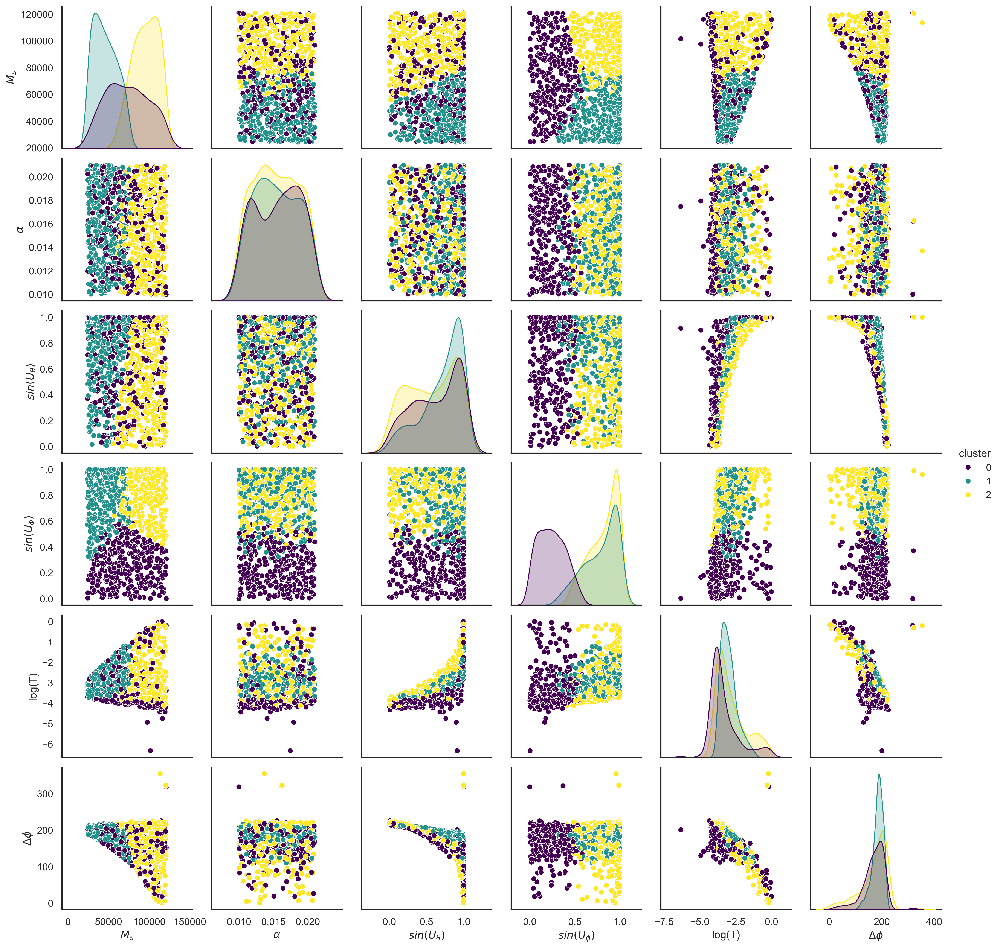

In [8]:
from sklearn.cluster import KMeans

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df["cluster"] = kmeans.fit_predict(X_scaled)

# Visualize clusters
sns.pairplot(df, hue="cluster", palette="viridis")
plt.show()


We use LASSO regression to keep the most important features.

In [9]:
from sklearn.linear_model import LassoCV

# LASSO feature selection
lasso = LassoCV(cv=5).fit(X_scaled, df["log(T)"])  # Fit to transmission first
selected_features = X.columns[lasso.coef_ != 0]

print("Selected Features:", list(selected_features))


Selected Features: ['$M_s$', '$sin(U_\\theta)$', '$sin(U_\\phi)$']


In [10]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

model = LinearRegression()
rfe = RFE(model, n_features_to_select=3)  # Adjust number of features
rfe.fit(X, df["log(T)"])

print("Selected Features by RFE:", X.columns[rfe.support_])


Selected Features by RFE: Index(['$M_s$', '$sin(U_\theta)$', '$sin(U_\phi)$'], dtype='object')


We try linear regression, polynomial regression, and multi-output regression.

In [11]:
import statsmodels.api as sm

X_selected = df[selected_features]  # Use selected features from LASSO or RFE
X_selected = sm.add_constant(X_selected)  # Add intercept
y = df["log(T)"]

# Fit OLS model
model = sm.OLS(y, X_selected).fit()
print(model.summary())  # Check p-values, R²


                            OLS Regression Results                            
Dep. Variable:                 log(T)   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     540.9
Date:                Mon, 18 Aug 2025   Prob (F-statistic):          1.71e-208
Time:                        10:30:27   Log-Likelihood:                -854.74
No. Observations:                1000   AIC:                             1717.
Df Residuals:                     996   BIC:                             1737.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -5.3963      0.073    -

### Second model (simpler)

In [18]:
# Simpler model (dropping alpha)
X2 = df[['$M_s$', r'$sin(U_\theta)$', r'$sin(U_\phi)$']]
X2 = sm.add_constant(X2)
model2 = sm.OLS(df['log(T)'], X2).fit()
print(model2.summary())  # Check p-values, R²

                            OLS Regression Results                            
Dep. Variable:                 log(T)   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     540.9
Date:                Mon, 18 Aug 2025   Prob (F-statistic):          1.71e-208
Time:                        10:37:30   Log-Likelihood:                -854.74
No. Observations:                1000   AIC:                             1717.
Df Residuals:                     996   BIC:                             1737.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -5.3963      0.073    -

### Third model (with interactions)

In [19]:
# Create interaction terms
df[r'$M_s$*$sin(U_\theta)$'] = df['$M_s$'] * df[r'$sin(U_\theta)$']
df[r'$M_s$*$sin(U_\phi)$'] = df['$M_s$'] * df[r'$sin(U_\phi)$']
df[r'$\alpha$*$sin(U_\theta)$'] = df[r'$\alpha$'] * df[r'$sin(U_\theta)$']
df[r'$\alpha$*$sin(U_\phi)$'] = df[r'$\alpha$'] * df[r'$sin(U_\phi)$']

# Include original variables and interactions
X_int = df[['$M_s$', r'$\alpha$', r'$sin(U_\theta)$', r'$sin(U_\phi)$',
            r'$M_s$*$sin(U_\theta)$', r'$M_s$*$sin(U_\phi)$',
            r'$\alpha$*$sin(U_\theta)$', r'$\alpha$*$sin(U_\phi)$']]
X_int = sm.add_constant(X_int)

# Fit the model
model_int = sm.OLS(df['log(T)'], X_int).fit()

print(model_int.summary())

                            OLS Regression Results                            
Dep. Variable:                 log(T)   R-squared:                       0.687
Model:                            OLS   Adj. R-squared:                  0.684
Method:                 Least Squares   F-statistic:                     271.7
Date:                Mon, 18 Aug 2025   Prob (F-statistic):          8.98e-244
Time:                        10:37:43   Log-Likelihood:                -757.49
No. Observations:                1000   AIC:                             1533.
Df Residuals:                     991   BIC:                             1577.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

### Visual predictive check

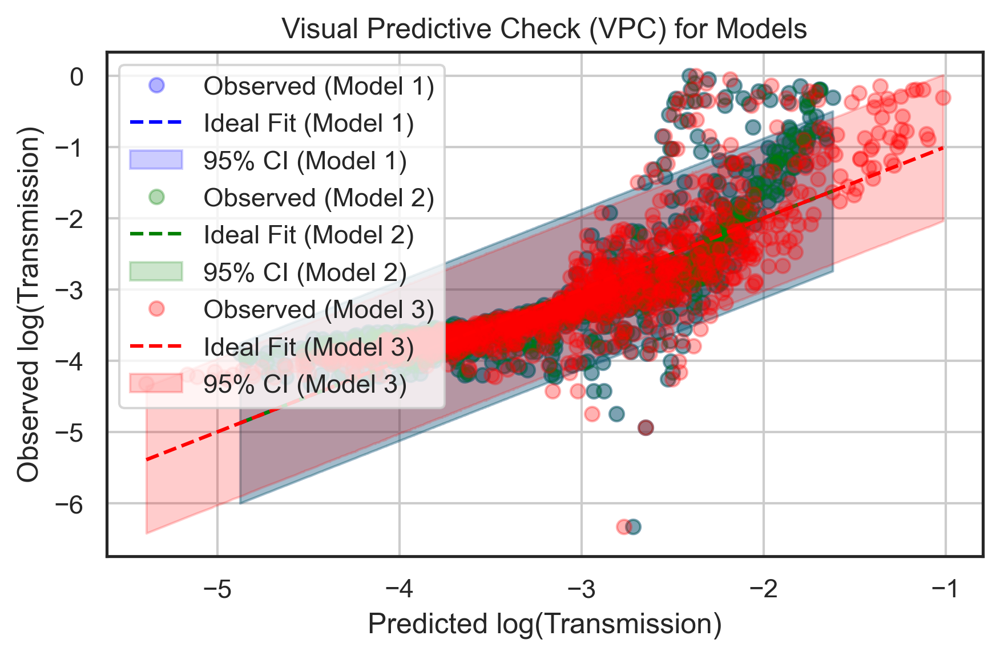

In [14]:

def plot_vpc(model, X, y_true, label, color):
    # Get predictions and standard errors
    pred = model.get_prediction(X)
    pred_summary = pred.summary_frame(alpha=0.05)  # 95% CI

    # Sort values for cleaner plots
    sort_idx = np.argsort(pred_summary['mean'])
    y_sorted = y_true.values[sort_idx]
    yhat_sorted = pred_summary['mean'][sort_idx]
    lower_sorted = pred_summary['obs_ci_lower'][sort_idx]
    upper_sorted = pred_summary['obs_ci_upper'][sort_idx]

    # Plot observed vs predicted
    plt.plot(yhat_sorted, y_sorted, 'o', label=f'Observed ({label})', alpha=0.3, color=color)
    plt.plot(yhat_sorted, yhat_sorted, '--', label=f'Ideal Fit ({label})', color=color)
    plt.fill_between(yhat_sorted, lower_sorted, upper_sorted, color=color, alpha=0.2, label=f'95% CI ({label})')

# Set up the figure
plt.figure()

# Call for each model
plot_vpc(model, X_selected, y, "Model 1", "blue")
plot_vpc(model2, X2, y, "Model 2", "green")
plot_vpc(model_int, X_int, y, "Model 3", "red")

# Final touches
plt.xlabel("Predicted log(Transmission)")
plt.ylabel("Observed log(Transmission)")
plt.title("Visual Predictive Check (VPC) for Models")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Residuals plots

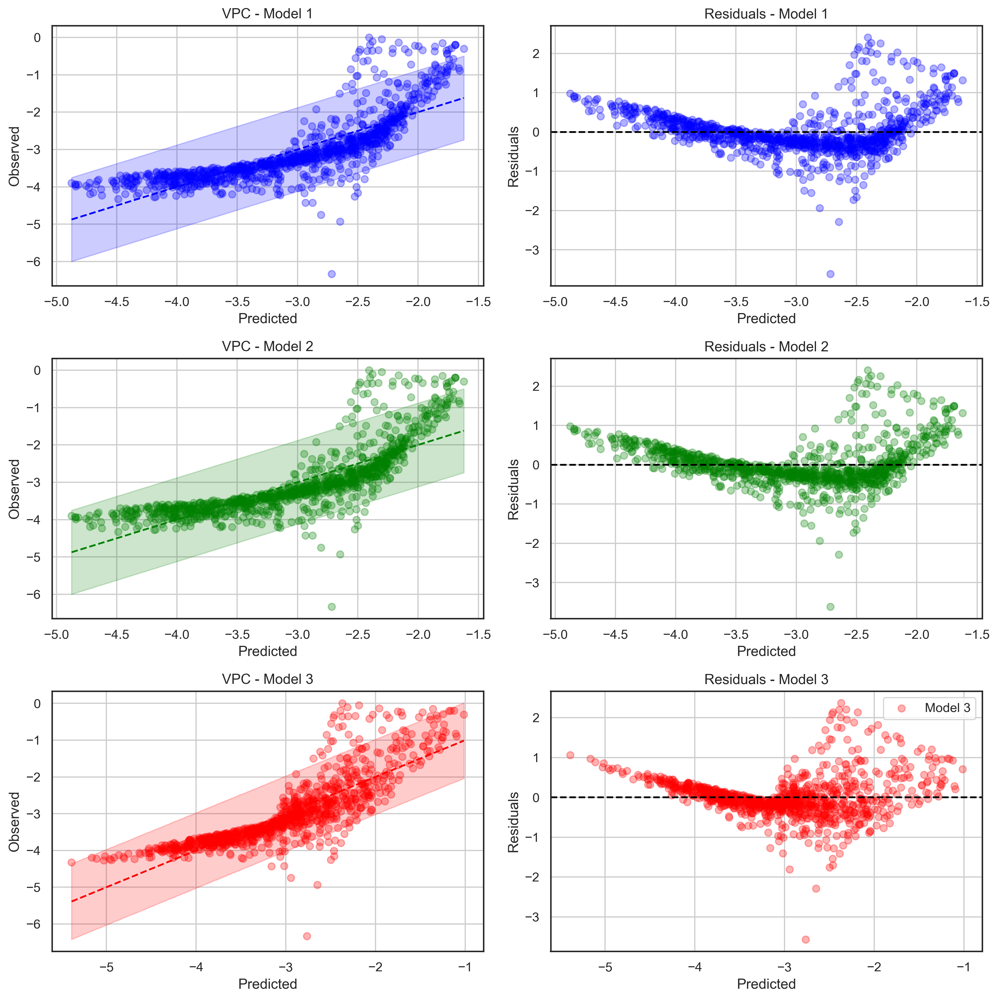

In [15]:

def plot_vpc_and_residuals(ax1, ax2, model, X, y_true, label, color):
    # Predictions and intervals
    pred = model.get_prediction(X)
    pred_summary = pred.summary_frame(alpha=0.05)

    y_pred = pred_summary['mean']
    ci_lower = pred_summary['obs_ci_lower']
    ci_upper = pred_summary['obs_ci_upper']
    residuals = y_true - y_pred

    # Sort for plotting
    sort_idx = np.argsort(y_pred)
    y_pred_sorted = y_pred.iloc[sort_idx]
    y_true_sorted = y_true.iloc[sort_idx]
    lower_sorted = ci_lower.iloc[sort_idx]
    upper_sorted = ci_upper.iloc[sort_idx]

    # === VPC Plot ===
    ax1.plot(y_pred_sorted, y_true_sorted, 'o', color=color, alpha=0.3, label=f'{label} Observed')
    ax1.plot(y_pred_sorted, y_pred_sorted, '--', color=color, label=f'{label} Ideal Fit')
    ax1.fill_between(y_pred_sorted, lower_sorted, upper_sorted, color=color, alpha=0.2)
    ax1.set_title(f'VPC - {label}')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Observed')
    ax1.grid(True)

    # === Residual Plot ===
    ax2.scatter(y_pred, residuals, alpha=0.3, color=color, label=label)
    ax2.axhline(0, color='black', linestyle='--')
    ax2.set_title(f'Residuals - {label}')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Residuals')
    ax2.grid(True)

# Create subplots (3 models, 2 plots each: 3 rows x 2 columns)
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Plot for each model
plot_vpc_and_residuals(axs[0, 0], axs[0, 1], model, X_selected, y, "Model 1", "blue")
plot_vpc_and_residuals(axs[1, 0], axs[1, 1], model2, X2, y, "Model 2", "green")
plot_vpc_and_residuals(axs[2, 0], axs[2, 1], model_int, X_int, y, "Model 3", "red")

# Adjust layout and show
plt.tight_layout()
plt.legend()
plt.show()


In [16]:
# Actual values
y_true = df['log(T)']

# --- Predictions from the three models ---
# 1. Base model (no interactions)
y_pred_1 = model.predict(X_selected)  # Adjust this to your base model and data

# 2. Second model (maybe with fewer terms)
y_pred_2 = model2.predict(X2)  # Adjust this accordingly

# 3. Best model (with interactions)
y_pred_best = model_int.predict(X_int)

# --- Compute metrics ---
def print_metrics(name, y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    print(f"{name}:\n  R²: {r2:.4f}\n  MAE: {mae:.4f}\n")

print_metrics("Model 1 (Base)", y_true, y_pred_1)
print_metrics("Model 2 (Intermediate)", y_true, y_pred_2)
print_metrics("Model 3 (With Interactions)", y_true, y_pred_best)

NameError: name 'r2_score' is not defined

In [17]:
# Collect AIC/BIC values from the models
model_comparison = pd.DataFrame({
    'Model': ['Model 1', 'Model 2', 'Model 3'],
    'AIC': [model.aic, model2.aic, model_int.aic],
    'BIC': [model.bic, model2.bic, model_int.bic]
})

# Sort by AIC (or BIC)
model_comparison_sorted = model_comparison.sort_values(by='AIC').reset_index(drop=True)

print(model_comparison_sorted)

     Model          AIC          BIC
0  Model 3  1532.985607  1577.155404
1  Model 1  1717.485511  1737.116532
2  Model 2  1717.485511  1737.116532


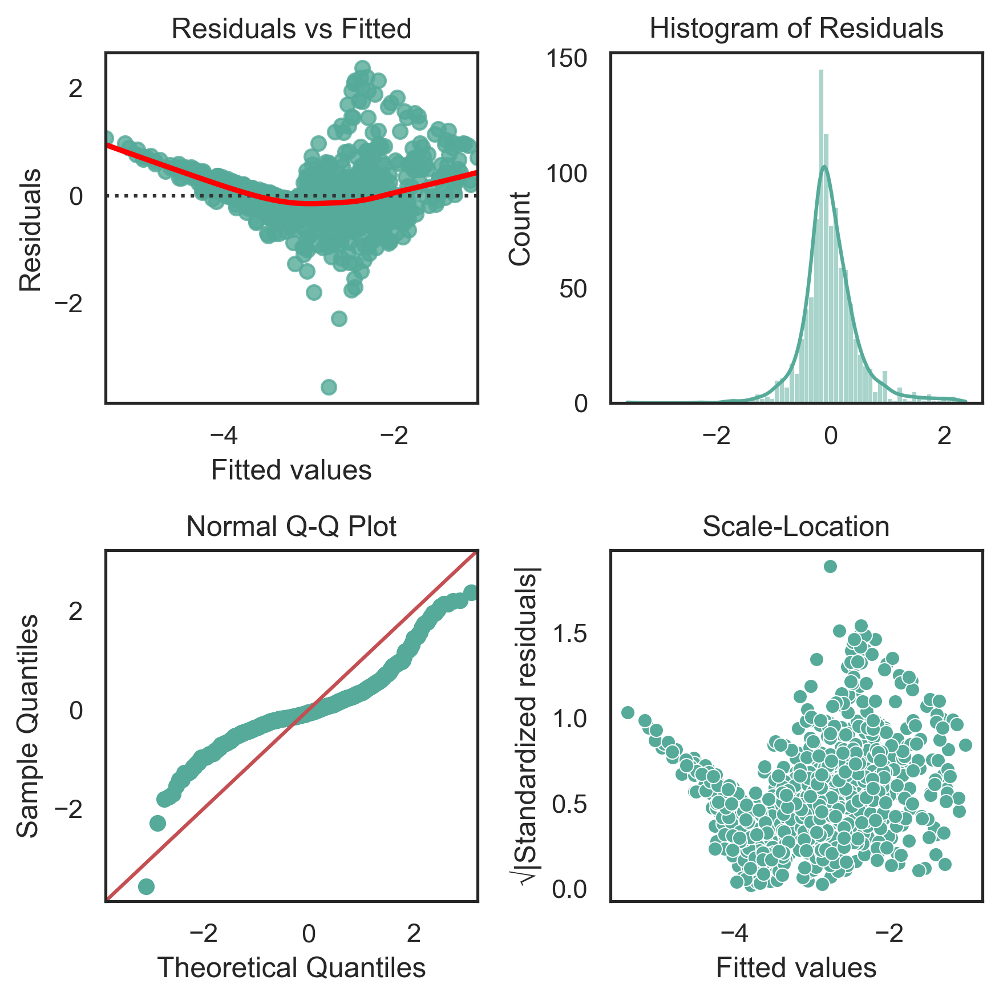

In [20]:
# Extract residuals and fitted values
residuals = model_int.resid
fitted = model_int.fittedvalues

# Plot residual diagnostics
fig, axs = plt.subplots(2, 2, figsize=(6,6))

# 1. Residuals vs Fitted
sns.residplot(x=fitted, y=residuals, lowess=True, ax=axs[0, 0], line_kws={'color': 'red'})
axs[0, 0].set_title('Residuals vs Fitted')
axs[0, 0].set_xlabel('Fitted values')
axs[0, 0].set_ylabel('Residuals')

# 2. Histogram of Residuals
sns.histplot(residuals, kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Histogram of Residuals')

# 3. Q-Q Plot
sm.qqplot(residuals, line='45', ax=axs[1, 0])
axs[1, 0].set_title('Normal Q-Q Plot')

# 4. Scale-Location (Spread vs Fitted)
sns.scatterplot(x=fitted, y=np.sqrt(np.abs(residuals)), ax=axs[1, 1])
axs[1, 1].set_title('Scale-Location')
axs[1, 1].set_xlabel('Fitted values')
axs[1, 1].set_ylabel('√|Standardized residuals|')

plt.tight_layout()
plt.show()

### the formula is:

In [21]:
def predict_log_transmission(M_s, alpha, sin_U_theta, sin_U_phi):
    return (
        -0.8423
        + 2.577e-6 * M_s
        - 4.5835 * alpha
        + 0.1236 * sin_U_theta
        - 0.2190 * sin_U_phi
        + 1.949e-6 * M_s * sin_U_theta
        - 2.097e-6 * M_s * sin_U_phi
        - 0.9198 * alpha * sin_U_theta
        + 5.7946 * alpha * sin_U_phi
    )


In [22]:
# Example input values
M_s = 1.21e5
alpha = 0.01
sin_U_theta = 0.5
sin_U_phi = 0.3

log_T = predict_log_transmission(M_s, alpha, sin_U_theta, sin_U_phi)
print("Predicted log(Transmission):", log_T)

Predicted log(Transmission): -0.5256398000000001


### Check multi-target fit and metrics

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import Ridge

'''
# Split data into training (80%) and testing (20%)
X_train, X_test, y_train, y_test = train_test_split(
    X, df[["log(T)", r"$\Delta \phi$"]], test_size=0.2, random_state=42
)
'''

scaler_y_T = StandardScaler() # MinMaxScaler()
scaler_y_P = StandardScaler() # MinMaxScaler()

y_T_scaled = scaler_y_T.fit_transform(df[["log(T)"]].values.reshape(-1, 1)).flatten()
y_P_scaled = scaler_y_P.fit_transform(df[[r"$\Delta \phi$"]].values.reshape(-1, 1)).flatten()

#y_T_scaled = df[["log(T)"]]
#y_P_scaled = df[[r"$\Delta \phi$"]]

seed = 33


X_train, X_test, y_T_train, y_T_test, y_P_train, y_P_test = train_test_split(
    X, y_T_scaled, y_P_scaled, test_size=0.2, random_state=seed
)

X_train_scaled = scaler.fit_transform(X_train) # ajusta y aplica la transformación.
X_test_scaled = scaler.transform(X_test) # solo aplica, usando la media y varianza de X_train




Best Parameters: {'polynomialfeatures__degree': 8, 'ridge__alpha': 10.0}
Best CV Score (MAE): 0.20553307119560707


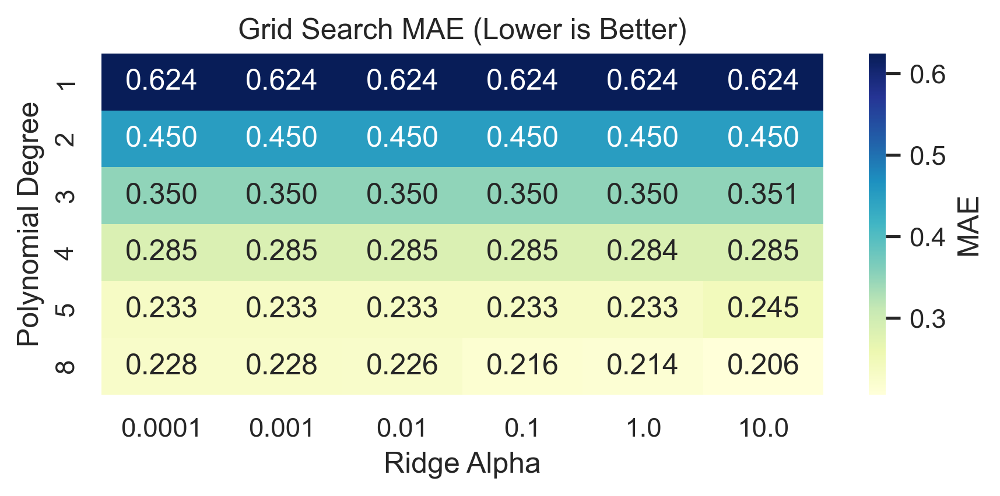

Best Parameters: {'polynomialfeatures__degree': 3, 'ridge__alpha': 10.0}
Best CV Score (MAE): 0.5331728576458342


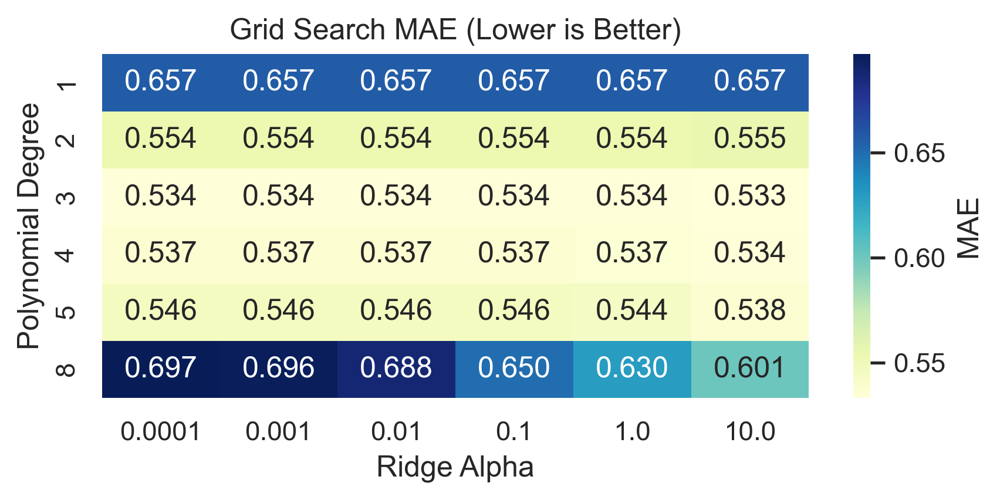

In [25]:
pipeline = make_pipeline(
    PolynomialFeatures(include_bias=False),
    Ridge()
)

param_grid = {
    'polynomialfeatures__degree': [1, 2, 3, 4, 5,8],
    'ridge__alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0]
}

scorer = make_scorer(mean_absolute_error, greater_is_better=False)
# Define RMSE scorer
rmse_scorer = make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False)

# Setup GridSearchCV
grid_T = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    scoring='neg_root_mean_squared_error',
    cv=5,
    n_jobs=-1,
    refit='R2'
)

# Fit to training data from T
grid_T.fit(X_train_scaled, y_T_train)   # antes era X-train y no scaled

# Best model
print("Best Parameters:", grid_T.best_params_)
print("Best CV Score (MAE):", -grid_T.best_score_)

# Best model pipeline
best_model_poly_T = grid_T.best_estimator_

# Extract results into a DataFrame
results_T = pd.DataFrame(grid_T.cv_results_)

# Convert negative MAE to positive
results_T['mean_test_mae'] = -results_T['mean_test_score']

# Pivot the table to make a heatmap: rows = degree, columns = alpha
pivot_table_T = results_T.pivot(
    index='param_polynomialfeatures__degree',
    columns='param_ridge__alpha',
    values='mean_test_mae'
)

# Plot heatmap
plt.figure(figsize=(6,3))
sns.heatmap(pivot_table_T, annot=True, fmt=".3f", cmap="YlGnBu", cbar_kws={'label': 'MAE'})
plt.title("Grid Search MAE (Lower is Better)")
plt.xlabel("Ridge Alpha")
plt.ylabel("Polynomial Degree")
plt.tight_layout()
plt.show()






# Setup GridSearchCV
grid_P = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    scoring='neg_root_mean_squared_error',
    cv=5,
    n_jobs=-1,
    refit='R2'
)

# Fit to training data from PS
grid_P.fit(X_train_scaled, y_P_train)

# Best model
print("Best Parameters:", grid_P.best_params_)
print("Best CV Score (MAE):", -grid_P.best_score_)

# Best model pipeline
best_model_poly_P = grid_P.best_estimator_

# Extract results into a DataFrame
results_P = pd.DataFrame(grid_P.cv_results_)

# Convert negative MAE to positive
results_P['mean_test_mae'] = -results_P['mean_test_score']

# Pivot the table to make a heatmap: rows = degree, columns = alpha
pivot_table_P = results_P.pivot(
    index='param_polynomialfeatures__degree',
    columns='param_ridge__alpha',
    values='mean_test_mae'
)

# Plot heatmap
plt.figure(figsize=(6,3))
sns.heatmap(pivot_table_P, annot=True, fmt=".3f", cmap="YlGnBu", cbar_kws={'label': 'MAE'})
plt.title("Grid Search MAE (Lower is Better)")
plt.xlabel("Ridge Alpha")
plt.ylabel("Polynomial Degree")
plt.tight_layout()
plt.show()

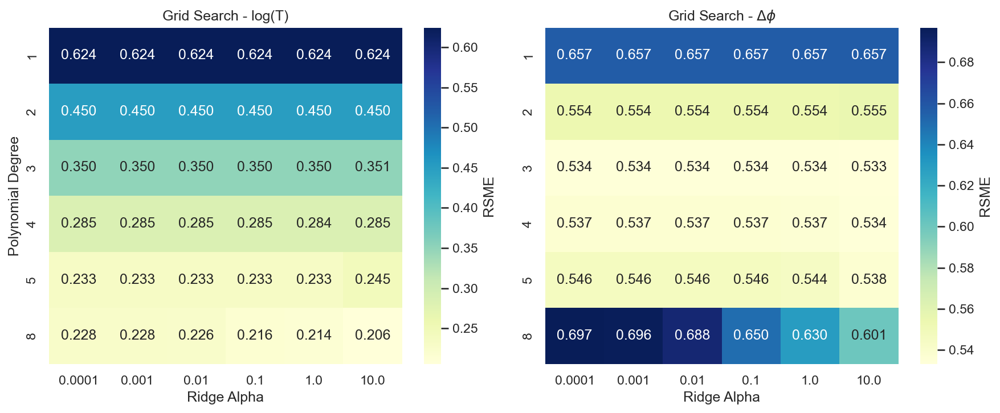

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract and process results for Transmission
results_T = pd.DataFrame(grid_T.cv_results_)
results_T['mean_test_mae'] = -results_T['mean_test_score']
pivot_T = results_T.pivot(
    index='param_polynomialfeatures__degree',
    columns='param_ridge__alpha',
    values='mean_test_mae'
)

# Extract and process results for Phase Shift
results_P = pd.DataFrame(grid_P.cv_results_)
results_P['mean_test_mae'] = -results_P['mean_test_score']
pivot_P = results_P.pivot(
    index='param_polynomialfeatures__degree',
    columns='param_ridge__alpha',
    values='mean_test_mae'
)

# Create 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), dpi=150)

# --- Heatmap for Transmission ---
sns.heatmap(pivot_T, annot=True, fmt=".3f", cmap="YlGnBu", ax=axs[0], cbar_kws={'label': 'RSME'})
axs[0].set_title("Grid Search - log(T)")
axs[0].set_xlabel("Ridge Alpha")
axs[0].set_ylabel("Polynomial Degree")

# --- Heatmap for Phase Shift ---
sns.heatmap(pivot_P, annot=True, fmt=".3f", cmap="YlGnBu", ax=axs[1], cbar_kws={'label': 'RSME'})
axs[1].set_title(r"Grid Search - $\Delta \phi$")
axs[1].set_xlabel("Ridge Alpha")
axs[1].set_ylabel("")

# Final layout
plt.tight_layout()
plt.savefig("grid_search_heatmaps_poly_ridge.pdf", format='pdf')
plt.show()


In [27]:
# Polynomial regression (degree=2)
poly_T = PolynomialFeatures(degree=2, include_bias=False)
model_poly_T = make_pipeline(poly_T, Ridge(alpha=0.1))  # Ridge avoids overfitting

# Polynomial regression (degree=2)
poly_P = PolynomialFeatures(degree=2, include_bias=False)
model_poly_P = make_pipeline(poly_P, Ridge(alpha=0.1))  # Ridge avoids overfitting

In [28]:
# Train polynomial model
model_poly_T.fit(X_train_scaled, y_T_train)
model_poly_P.fit(X_train_scaled, y_P_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(include_bias=False)),
                ('ridge', Ridge(alpha=0.1))])

In [29]:
# Predict on the test set
y_pred_test_T = model_poly_T.predict(X_test_scaled)
y_pred_test_P = model_poly_P.predict(X_test_scaled)



In [30]:
from sklearn.metrics import r2_score

# Evaluate Transmission
mse_transmission = root_mean_squared_error(y_T_test, y_pred_test_T)
r2_transmission = r2_score(y_T_test, y_pred_test_T)

# Evaluate Phase Shift
mse_phase_shift = root_mean_squared_error(y_P_test, y_pred_test_P)
r2_phase_shift = r2_score(y_P_test, y_pred_test_P)

print(f"Transmission - RMSE: {mse_transmission:.3f}, R²: {r2_transmission:.3f}")
print(f"Phase Shift - RMSE: {mse_phase_shift:.3f}, R²: {r2_phase_shift:.3f}")


Transmission - RMSE: 0.464, R²: 0.772
Phase Shift - RMSE: 0.376, R²: 0.849


In [31]:
# Predict using the polynomial model on scaled X
y_pred_test_T_scaled = model_poly_T.predict(X_test_scaled)
y_pred_test_P_scaled = model_poly_P.predict(X_test_scaled)

# Inverse-transform predictions and the true y values
y_pred_test_T = scaler_y_T.inverse_transform(y_pred_test_T_scaled.reshape(-1, 1)).ravel()
y_true_test_T = scaler_y_T.inverse_transform(y_T_test.reshape(-1, 1)).ravel()

y_pred_test_P = scaler_y_P.inverse_transform(y_pred_test_P_scaled.reshape(-1, 1)).ravel()
y_true_test_P = scaler_y_P.inverse_transform(y_P_test.reshape(-1, 1)).ravel()

# Compute MAE in the original units
mae_T = mean_absolute_error(y_true_test_T, y_pred_test_T)
mae_P = mean_absolute_error(y_true_test_P, y_pred_test_P)

print("MAE (T) in original units:", mae_T)
print("MAE (P) in original units:", mae_P)

MAE (T) in original units: 0.23009938923488135
MAE (P) in original units: 8.837805912187898


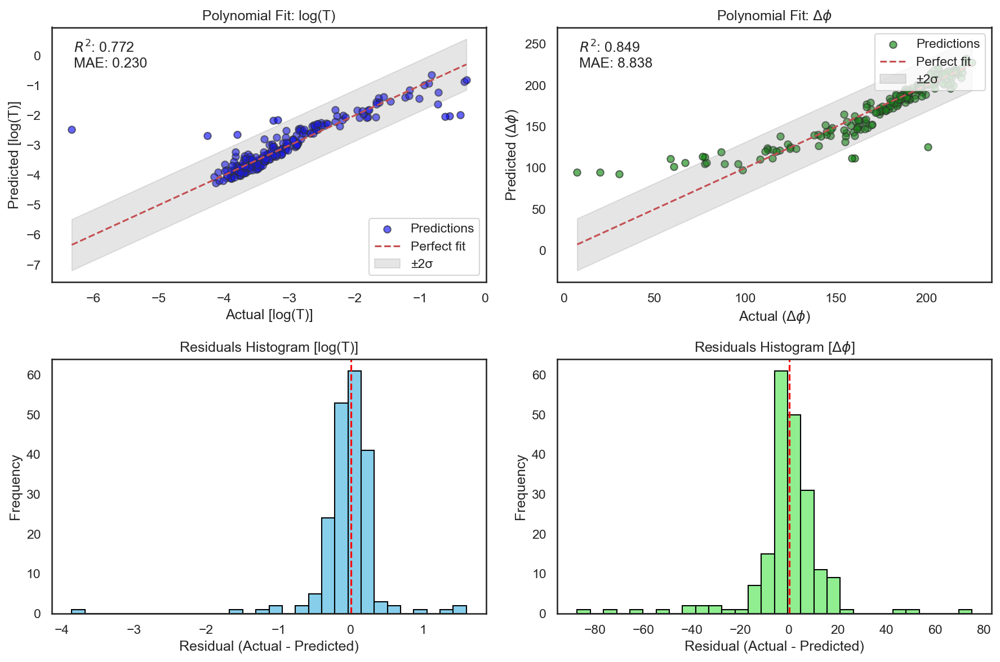

In [32]:
from sklearn.metrics import r2_score, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

# === Calculate Residuals for Polynomial Model ===
residuals_poly_T = y_true_test_T - y_pred_test_T
residuals_poly_P = y_true_test_P - y_pred_test_P

std_poly_T = np.std(residuals_poly_T)
std_poly_P = np.std(residuals_poly_P)

# === Metrics ===
r2_poly_T = r2_score(y_true_test_T, y_pred_test_T)
mae_poly_T = mean_absolute_error(y_true_test_T, y_pred_test_T)

r2_poly_P = r2_score(y_true_test_P, y_pred_test_P)
mae_poly_P = mean_absolute_error(y_true_test_P, y_pred_test_P)

# === Create Figure with 2x2 layout ===
fig, axs = plt.subplots(2, 2, figsize=(12, 8), dpi=150)

# === Plot A1: Transmission Scatter + PI ===
axs[0, 0].scatter(y_true_test_T, y_pred_test_T, alpha=0.6, edgecolor='k', color='blue', label="Predictions")
line_T = np.linspace(y_true_test_T.min(), y_true_test_T.max(), 100)
axs[0, 0].plot(line_T, line_T, 'r--', label="Perfect fit")
axs[0, 0].fill_between(line_T, line_T - 2*std_poly_T, line_T + 2*std_poly_T, color='gray', alpha=0.2, label="±2σ")

axs[0, 0].set_title("Polynomial Fit: log(T)")
axs[0, 0].set_xlabel("Actual [log(T)]")
axs[0, 0].set_ylabel("Predicted [log(T)]")
axs[0, 0].legend()
axs[0, 0].text(
    0.05, 0.95,
    f"$R^2$: {r2_poly_T:.3f}\nMAE: {mae_poly_T:.3f}",
    transform=axs[0, 0].transAxes,
    verticalalignment='top',
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

# === Plot A2: Transmission Residuals Histogram ===
axs[1, 0].hist(residuals_poly_T, bins=30, color='skyblue', edgecolor='black')
axs[1, 0].axvline(0, color='red', linestyle='--')
axs[1, 0].set_title("Residuals Histogram [log(T)]")
axs[1, 0].set_xlabel("Residual (Actual - Predicted)")
axs[1, 0].set_ylabel("Frequency")

# === Plot B1: Phase Shift Scatter + PI ===
axs[0, 1].scatter(y_true_test_P, y_pred_test_P, alpha=0.6, edgecolor='k', color='green', label="Predictions")
line_P = np.linspace(y_true_test_P.min(), y_true_test_P.max(), 100)
axs[0, 1].plot(line_P, line_P, 'r--', label="Perfect fit")
axs[0, 1].fill_between(line_P, line_P - 2*std_poly_P, line_P + 2*std_poly_P, color='gray', alpha=0.2, label="±2σ")

axs[0, 1].set_title(r"Polynomial Fit: $\Delta\phi$")
axs[0, 1].set_xlabel(r"Actual ($\Delta\phi$)")
axs[0, 1].set_ylabel(r"Predicted ($\Delta\phi$)")
axs[0, 1].legend(loc='upper right')
axs[0, 1].text(
    0.05, 0.95,
    f"$R^2$: {r2_poly_P:.3f}\nMAE: {mae_poly_P:.3f}",
    transform=axs[0, 1].transAxes,
    verticalalignment='top',
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

# === Plot B2: Phase Shift Residuals Histogram ===
axs[1, 1].hist(residuals_poly_P, bins=30, color='lightgreen', edgecolor='black')
axs[1, 1].axvline(0, color='red', linestyle='--')
axs[1, 1].set_title(r"Residuals Histogram [$\Delta\phi$]")
axs[1, 1].set_xlabel("Residual (Actual - Predicted)")
axs[1, 1].set_ylabel("Frequency")

# === Final Layout ===
plt.tight_layout()
plt.savefig("polyreg_actual_vs_pred_with_residuals.pdf", format='pdf')
plt.show()


In [33]:
# Get the coefficients and intercept of the fitted model
coef_T = model_poly_T.named_steps['ridge'].coef_
intercept_T = model_poly_T.named_steps['ridge'].intercept_

print(f"Intercept: {intercept_T}")
print("Coefficients:")
print(coef_T)

# Generate the formula for the polynomial model
poly_features_T = model_poly_T.named_steps['polynomialfeatures'].get_feature_names_out(X.columns)
formula_T = f"Transmission = {intercept_T:.4f} + "
formula_T += " + ".join([f"{coef_T[i]:.4f} * {poly_features_T[i]}" for i in range(len(coef_T))])

print("Polynomial Model Formula:")
print(formula_T)

Intercept: -0.5047290154832212
Coefficients:
[0.19200514 0.91933757 0.30057038 0.00735428 0.24183303 0.11711681
 0.40936383 0.02416149 0.10514519]
Polynomial Model Formula:
Transmission = -0.5047 + 0.1920 * $M_s$ + 0.9193 * $sin(U_\theta)$ + 0.3006 * $sin(U_\phi)$ + 0.0074 * $M_s$^2 + 0.2418 * $M_s$ $sin(U_\theta)$ + 0.1171 * $M_s$ $sin(U_\phi)$ + 0.4094 * $sin(U_\theta)$^2 + 0.0242 * $sin(U_\theta)$ $sin(U_\phi)$ + 0.1051 * $sin(U_\phi)$^2


In [35]:
mean_y = scaler_y_T.mean_[0]
std_y = scaler_y_T.scale_[0]

intercept_T_original = intercept_T * std_y + mean_y
coef_T_original = coef_T * std_y


formula_T = f"log(T) = {intercept_T_original:.4f} + "
formula_T += " + ".join([f"{coef_T_original[i]:.4f} * {poly_features_T[i]}" for i in range(len(coef_T_original))])

print("Polynomial Model Formula:")
print(formula_T)

Polynomial Model Formula:
log(T) = -3.4817 + 0.1771 * $M_s$ + 0.8479 * $sin(U_\theta)$ + 0.2772 * $sin(U_\phi)$ + 0.0068 * $M_s$^2 + 0.2230 * $M_s$ $sin(U_\theta)$ + 0.1080 * $M_s$ $sin(U_\phi)$ + 0.3776 * $sin(U_\theta)$^2 + 0.0223 * $sin(U_\theta)$ $sin(U_\phi)$ + 0.0970 * $sin(U_\phi)$^2


In [36]:
# Get the coefficients and intercept of the fitted model
coef_P = model_poly_P.named_steps['ridge'].coef_
intercept_P = model_poly_P.named_steps['ridge'].intercept_

print(f"Intercept: {intercept_P}")
print("Coefficients:")
print(coef_P)

# Generate the formula for the polynomial model
poly_features_P = model_poly_P.named_steps['polynomialfeatures'].get_feature_names_out(X.columns)
formula_P = f"Phase SHift = {intercept_P:.4f} + "
formula_P += " + ".join([f"{coef_P[i]:.4f} * {poly_features_P[i]}" for i in range(len(coef_P))])

print("Polynomial Model Formula:")
print(formula_P)

Intercept: 0.1386860289470226
Coefficients:
[-0.33056082 -0.80326914  0.08309108  0.04942545 -0.28941246 -0.04676521
 -0.24340744 -0.03441484  0.03584736]
Polynomial Model Formula:
Phase SHift = 0.1387 + -0.3306 * $M_s$ + -0.8033 * $sin(U_\theta)$ + 0.0831 * $sin(U_\phi)$ + 0.0494 * $M_s$^2 + -0.2894 * $M_s$ $sin(U_\theta)$ + -0.0468 * $M_s$ $sin(U_\phi)$ + -0.2434 * $sin(U_\theta)$^2 + -0.0344 * $sin(U_\theta)$ $sin(U_\phi)$ + 0.0358 * $sin(U_\phi)$^2


In [37]:
mean_y = scaler_y_P.mean_[0]
std_y = scaler_y_P.scale_[0]

intercept_P_original = intercept_P * std_y + mean_y
coef_P_original = coef_P * std_y


formula_P = f"PS = {intercept_P_original:.4f} + "
formula_P += " + ".join([f"{coef_P_original[i]:.4f} * {poly_features_P[i]}" for i in range(len(coef_P_original))])

print("Polynomial Model Formula:")
print(formula_P)

Polynomial Model Formula:
PS = 180.8142 + -13.8112 * $M_s$ + -33.5616 * $sin(U_\theta)$ + 3.4716 * $sin(U_\phi)$ + 2.0651 * $M_s$^2 + -12.0920 * $M_s$ $sin(U_\theta)$ + -1.9539 * $M_s$ $sin(U_\phi)$ + -10.1699 * $sin(U_\theta)$^2 + -1.4379 * $sin(U_\theta)$ $sin(U_\phi)$ + 1.4977 * $sin(U_\phi)$^2


In [38]:

# Split your dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X, df["Phase Shift (deg)"], test_size=0.2, random_state=42)

# Fit the model with training data
model_poly.fit(X_train, y_train)

# Predict with test data
y_pred_test = model_poly.predict(X_test)

# Evaluate performance
from sklearn.metrics import mean_squared_error, r2_score

mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

print(f"Polynomial Model - Test MSE: {mse_test:.4f}, R²: {r2_test:.4f}")

# Visualize predictions vs true values
fig, ax = plt.subplots(ncols=1, sharey=True) # sharey = True : comparte eje vertical

ax.scatter(y_test, y_pred_test, color='blue', label='Predicted vs True')
ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Ideal line
ax.set_xlabel('True Values')
ax.set_ylabel('Predicted Values')
ax.set_title('Polynomial Model: Predictions vs True Values')
ax.legend()
ax.set_box_aspect(1)
plt.show()


KeyError: 'Phase Shift (deg)'

In [133]:
# Get the coefficients of the polynomial regression for Phase Shift model
phase_shift_coefs = model_poly.named_steps['ridge'].coef_
phase_shift_intercept = model_poly.named_steps['ridge'].intercept_

# Get the feature names after polynomial transformation
poly_features = model_poly.named_steps['polynomialfeatures'].get_feature_names_out(X.columns)

# Combine the feature names with the corresponding coefficients
coefficients = list(zip(poly_features, phase_shift_coefs[1]))  # Index 1 corresponds to Phase Shift model

# Print the formula for Phase Shift
formula = f"Phase Shift (deg) = {phase_shift_intercept[0]:.4f} "
for feature, coef in coefficients:
    formula += f"+ {coef:.4f} * {feature} "
    
print("Polynomial Model Formula for Phase Shift (deg):")
print(formula)


TypeError: 'numpy.float64' object is not iterable

In [134]:
formula = f"{intercept:.3f} " + " + ".join(
    [f"{coef:.3f} * {name}" for coef, name in zip(coefficients, feature_names)]
)
print("Polynomial Model Formula:")
print(formula)


NameError: name 'coefficients' is not defined

### Visualize the poly model and the data fit

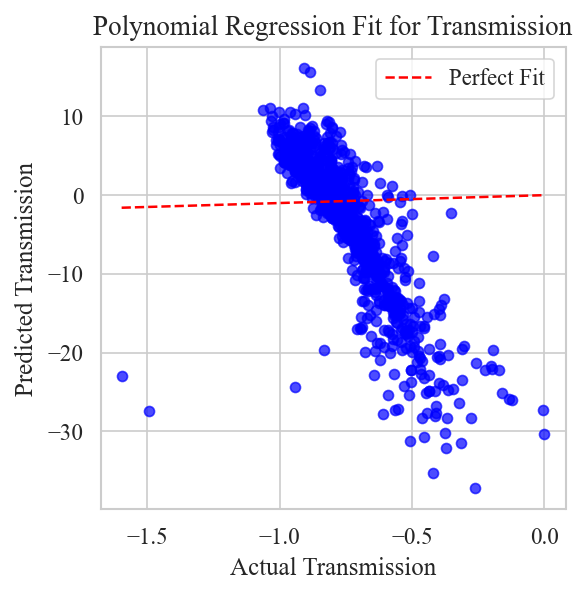

In [135]:

# Get predicted values
y_pred_transmission = model_poly.predict(X)

# Scatter plot of actual vs predicted values
plt.figure(figsize=(4,4))
plt.scatter(df["log(Transmission)"], y_pred_transmission, alpha=0.7, color="blue")
plt.plot([df["log(Transmission)"].min(), df["log(Transmission)"].max()], 
         [df["log(Transmission)"].min(), df["log(Transmission)"].max()], 
         linestyle="--", color="red", label="Perfect Fit")  # Ideal 1:1 line
plt.xlabel("Actual Transmission")
plt.ylabel("Predicted Transmission")
plt.title("Polynomial Regression Fit for Transmission")
plt.legend()
plt.show()


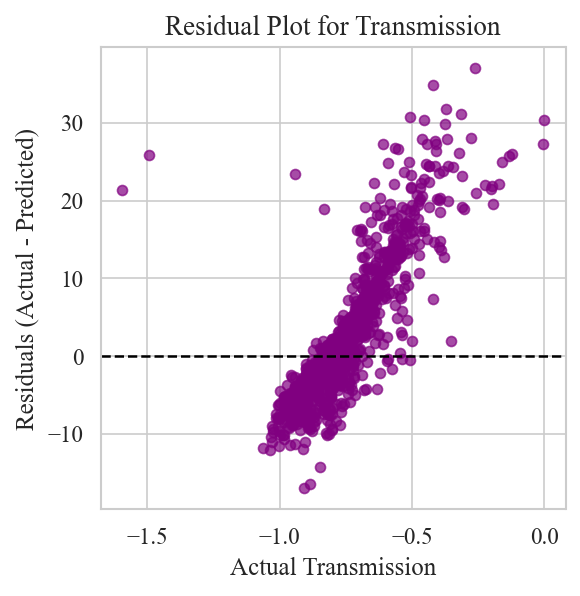

In [136]:
residuals_transmission = df["log(Transmission)"] - y_pred_transmission

plt.figure(figsize=(4,4))
plt.scatter(df["log(Transmission)"], residuals_transmission, alpha=0.7, color="purple")
plt.axhline(0, linestyle="--", color="black")  # Reference line
plt.xlabel("Actual Transmission")
plt.ylabel("Residuals (Actual - Predicted)")
plt.title("Residual Plot for Transmission")
plt.show()


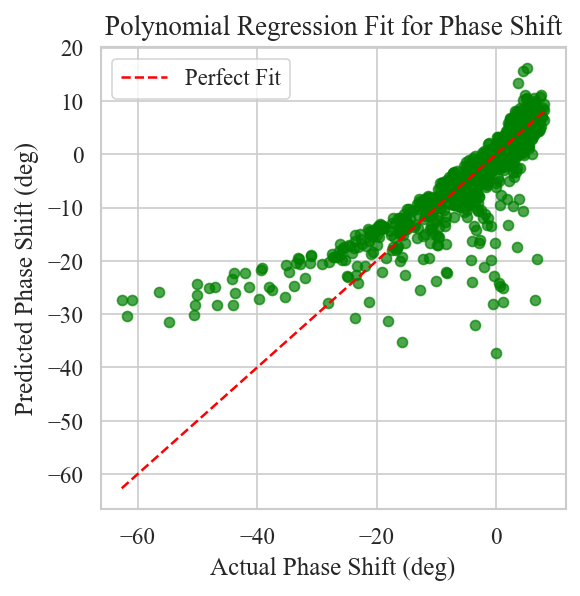

In [137]:
# Get predicted values for Phase Shift
y_pred_phase_shift = model_poly.predict(X)  # Assuming model_poly is trained for both

plt.figure(figsize=(4,4))
plt.scatter(df["Phase Shift (deg)"], y_pred_phase_shift, alpha=0.7, color="green")
plt.plot([df["Phase Shift (deg)"].min(), df["Phase Shift (deg)"].max()], 
         [df["Phase Shift (deg)"].min(), df["Phase Shift (deg)"].max()], 
         linestyle="--", color="red", label="Perfect Fit")  
plt.xlabel("Actual Phase Shift (deg)")
plt.ylabel("Predicted Phase Shift (deg)")
plt.title("Polynomial Regression Fit for Phase Shift")
plt.legend()
plt.show()


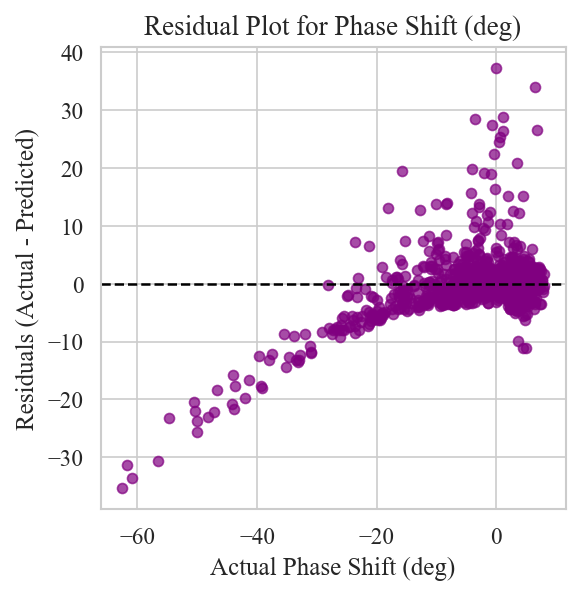

In [138]:
residuals_transmission = df["Phase Shift (deg)"] - y_pred_transmission

plt.figure(figsize=(4,4))
plt.scatter(df["Phase Shift (deg)"], residuals_transmission, alpha=0.7, color="purple")
plt.axhline(0, linestyle="--", color="black")  # Reference line
plt.xlabel("Actual Phase Shift (deg)")
plt.ylabel("Residuals (Actual - Predicted)")
plt.title("Residual Plot for Phase Shift (deg)")
plt.show()

In [139]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor

# Define multi-output model
multi_target_model = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))

# Fit model to both target variables
multi_target_model.fit(X, df[["log(Transmission)", "Phase Shift (deg)"]])

# Predict
y_pred = multi_target_model.predict(X)

# Evaluate
r2_transmission = r2_score(df["log(Transmission)"], y_pred[:,0])
r2_phase_shift = r2_score(df["Phase Shift (deg)"], y_pred[:,1])

print(f"R² Transmission: {r2_transmission}, R² Phase Shift: {r2_phase_shift}")


R² Transmission: 0.9873243624610901, R² Phase Shift: 0.9921712579415662


In [140]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, root_mean_squared_error, mean_absolute_error

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, df[["log(Transmission)", "Phase Shift (deg)"]], test_size=0.2, random_state=42)

# Fit model
multi_target_model.fit(X_train, y_train)

# Predict
y_pred_test = multi_target_model.predict(X_test)

# Evaluate

mse = mean_squared_error(y_test, y_pred_test)

rmse = root_mean_squared_error(y_test, y_pred_test)  # RMSE
mae = mean_absolute_error(y_test, y_pred_test)  # MAE

print("Test RMSE:", rmse)


Test RMSE: 0.7168826147306184


Use scatter plots to check for bad predictions:

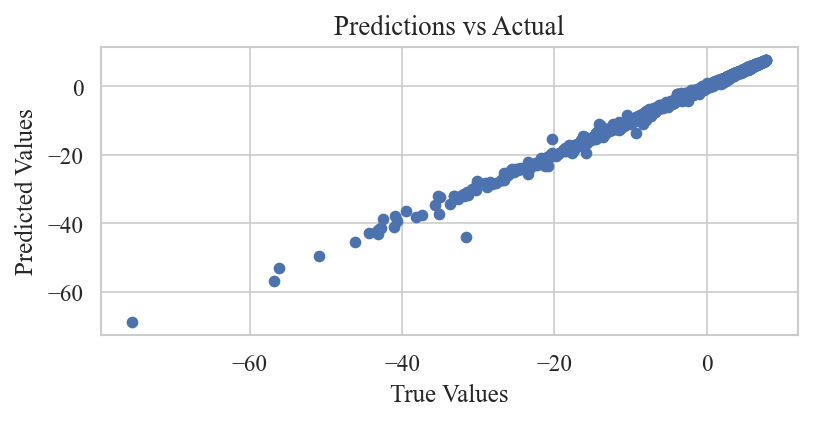

In [111]:
plt.scatter(y_test, y_pred_test)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predictions vs Actual")
plt.show()


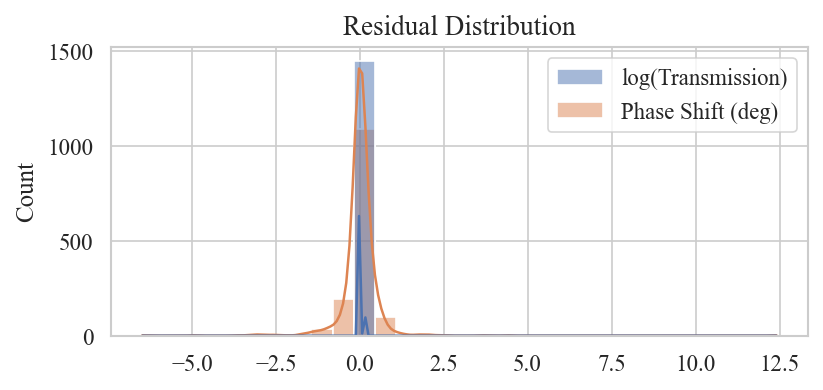

In [112]:
residuals = y_test - y_pred_test
sns.histplot(residuals, bins=30, kde=True)
plt.title("Residual Distribution")
plt.show()


### If you applied PCA before regression:

In [113]:
from sklearn.decomposition import PCA

# Apply PCA to explanatory variables
pca = PCA(n_components=5)  # Adjust components as needed
X_pca = pca.fit_transform(X_train)

# Fit regression on PCA-transformed features
model_pca = sm.OLS(y_train, sm.add_constant(X_pca)).fit()

# Print summary
print(model_pca.summary())


ValueError: n_components=5 must be between 0 and min(n_samples, n_features)=4 with svd_solver='covariance_eigh'

In [34]:
components = pca.components_  # PCA loadings
explained_var = pca.explained_variance_ratio_

for i, comp in enumerate(components):
    formula_pca = " + ".join(f"{comp[j]:.4f} * {X_train.columns[j]}" for j in range(len(comp)))
    print(f"PC{i+1} = {formula_pca}  (Explains {explained_var[i]:.2%} of variance)")


AttributeError: 'PCA' object has no attribute 'components_'